# Installation

In [29]:
!pip install -qU gcvit --no-deps
!pip install -q tensorflow_addons

## Imports

In [30]:
import tensorflow as tf
from tensorflow import keras
import tensorflow_datasets as tfds

tfds.disable_progress_bar()

import os
import sys
import math
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

## TPU/GPU detection

In [31]:
try:  # detect TPUs
    tpu = tf.distribute.cluster_resolver.TPUClusterResolver.connect()  # TPU detection
    strategy = tf.distribute.TPUStrategy(tpu)
except ValueError:  # detect GPUss
    strategy = (
        tf.distribute.get_strategy()
    )  # default strategy that works on CPU and single GPU
print("Number of Accelerators: ", strategy.num_replicas_in_sync)

Number of Accelerators:  1


## Configuration

In [32]:
# Model
IMAGE_SIZE = [224, 224]

# TPU
# if tpu:
#     BATCH_SIZE = (
#         16 * strategy.num_replicas_in_sync
#     )  # a TPU has 8 cores so this will be 128
# else:
#     BATCH_SIZE = 32  # on Colab/GPU, a higher batch size may throw(OOM)
BATCH_SIZE = 32

# Dataset
CLASSES = [
    "dandelion",
    "daisy",
    "tulips",
    "sunflowers",
    "roses",
]  # don't change the order

# Other constants
MEAN = tf.constant([0.485 * 255, 0.456 * 255, 0.406 * 255])  # imagenet mean
STD = tf.constant([0.229 * 255, 0.224 * 255, 0.225 * 255])  # imagenet std
AUTO = tf.data.AUTOTUNE

# Data Pipeline

In [33]:
def make_dataset(dataset: tf.data.Dataset, train: bool, image_size: int = IMAGE_SIZE):
    def preprocess(image, label):
        # for training, do augmentation
        if train:
            if tf.random.uniform(shape=[]) > 0.5:
                image = tf.image.flip_left_right(image)
        image = tf.image.resize(image, size=image_size, method="bicubic")
        image = (image - MEAN) / STD  # normalization
        return image, label

    if train:
        dataset = dataset.shuffle(BATCH_SIZE * 10)

    return dataset.map(preprocess, AUTO).batch(BATCH_SIZE, drop_remainder=True).prefetch(AUTO)

# Flower Dataset

In [34]:
train_dataset, val_dataset = tfds.load(
    "tf_flowers",
    split=["train[:90%]", "train[90%:]"],
    as_supervised=True,
    try_gcs=True,  # gcs_path is necessary for tpu,
)

num_train = tf.data.experimental.cardinality(train_dataset)
num_val = tf.data.experimental.cardinality(val_dataset)
print(f"Number of training examples: {num_train}")
print(f"Number of validation examples: {num_val}")


Number of training examples: 3303
Number of validation examples: 367


## Prepare dataset

In [35]:
train_dataset = make_dataset(train_dataset, True)
val_dataset = make_dataset(val_dataset, False)

## Visualize

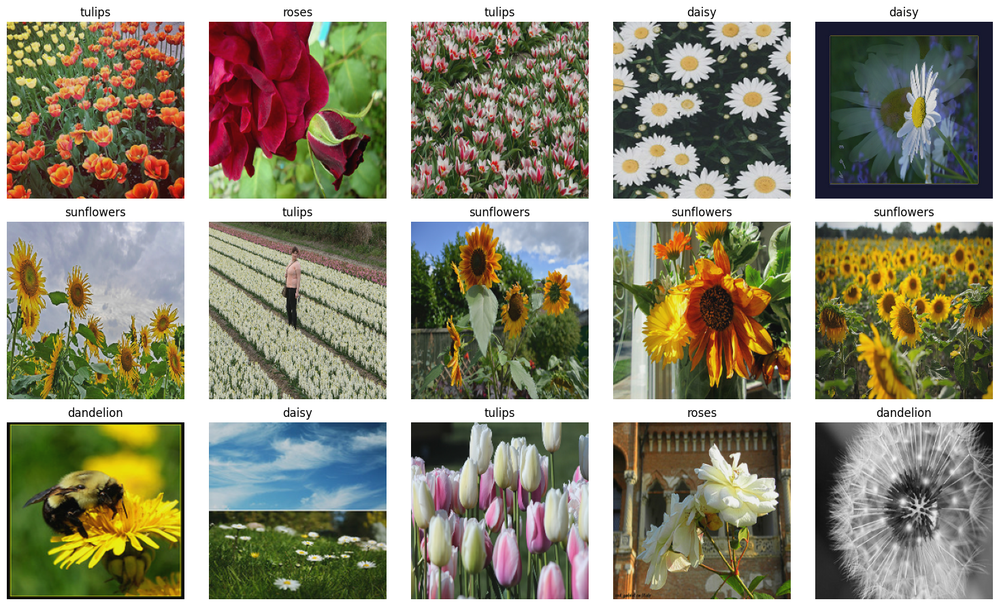

In [36]:
sample_images, sample_labels = next(iter(train_dataset))

plt.figure(figsize=(5 * 3, 3 * 3))
for n in range(15):
    ax = plt.subplot(3, 5, n + 1)
    image = (sample_images[n] * STD + MEAN).numpy()
    image = (image - image.min()) / (
        image.max() - image.min()
    )  # convert to [0, 1] for avoiding matplotlib warning
    plt.imshow(image)
    plt.title(CLASSES[sample_labels[n]])
    plt.axis("off")
plt.tight_layout()
plt.show()


# LR Scheduler Utility

In [37]:
# Reference:
# https://www.kaggle.com/ashusma/training-rfcx-tensorflow-tpu-effnet-b2


class WarmUpCosine(tf.keras.optimizers.schedules.LearningRateSchedule):
    def __init__(
        self, learning_rate_base, total_steps, warmup_learning_rate, warmup_steps
    ):
        super(WarmUpCosine, self).__init__()

        self.learning_rate_base = learning_rate_base
        self.total_steps = total_steps
        self.warmup_learning_rate = warmup_learning_rate
        self.warmup_steps = warmup_steps
        self.pi = tf.constant(np.pi)

    def __call__(self, step):
        if self.total_steps < self.warmup_steps:
            raise ValueError("Total_steps must be larger or equal to warmup_steps.")
        learning_rate = (
            0.5
            * self.learning_rate_base
            * (
                1
                + tf.cos(
                    self.pi
                    * (tf.cast(step, tf.float32) - self.warmup_steps)
                    / float(self.total_steps - self.warmup_steps)
                )
            )
        )

        if self.warmup_steps > 0:
            if self.learning_rate_base < self.warmup_learning_rate:
                raise ValueError(
                    "Learning_rate_base must be larger or equal to "
                    "warmup_learning_rate."
                )
            slope = (
                self.learning_rate_base - self.warmup_learning_rate
            ) / self.warmup_steps
            warmup_rate = slope * tf.cast(step, tf.float32) + self.warmup_learning_rate
            learning_rate = tf.where(
                step < self.warmup_steps, warmup_rate, learning_rate
            )
        return tf.where(
            step > self.total_steps, 0.0, learning_rate, name="learning_rate"
        )

# Training Hyperparameters

In [38]:
EPOCHS = 10
WARMUP_STEPS = 10
INIT_LR = 0.03
WAMRUP_LR = 0.006

TOTAL_STEPS = int((num_train / BATCH_SIZE) * EPOCHS)

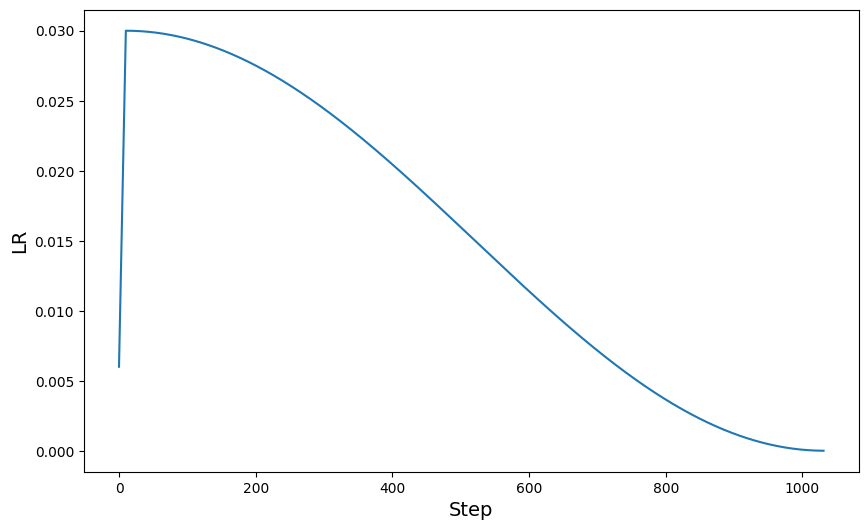

In [39]:
scheduled_lrs = WarmUpCosine(
    learning_rate_base=INIT_LR,
    total_steps=TOTAL_STEPS,
    warmup_learning_rate=WAMRUP_LR,
    warmup_steps=WARMUP_STEPS,
)

lrs = [scheduled_lrs(step) for step in range(TOTAL_STEPS)]
plt.figure(figsize=(10, 6))
plt.plot(lrs)
plt.xlabel("Step", fontsize=14)
plt.ylabel("LR", fontsize=14)
plt.show()


In [40]:
optimizer = keras.optimizers.SGD(scheduled_lrs)
loss = keras.losses.SparseCategoricalCrossentropy()

# Building GCViT

<h1 align="center">
<p><a href='https://arxiv.org/pdf/2206.09959v1.pdf'>GCViT: Global Context Vision Transformer</a></p>
</h1>
<div align=center><img src="https://raw.githubusercontent.com/awsaf49/gcvit-tf/main/image/lvg_arch.PNG" width=800></div>
<p align="center">
<a href="https://github.com/awsaf49/gcvit-tf/blob/main/LICENSE.md">
  <img src="https://img.shields.io/badge/License-MIT-yellow.svg">
</a>
<img alt="python" src="https://img.shields.io/badge/python-%3E%3D3.6-blue?logo=python">
<img alt="tensorflow" src="https://img.shields.io/badge/tensorflow-%3E%3D2.4.1-orange?logo=tensorflow">
<div align=center><p>
<a target="_blank" href="https://huggingface.co/spaces/awsaf49/gcvit-tf"><img src="https://img.shields.io/badge/🤗%20Hugging%20Face-Spaces-yellow.svg"></a>
<a href="https://colab.research.google.com/github/awsaf49/gcvit-tf/blob/main/notebooks/GCViT_Flower_Classification.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>
<a href="https://www.kaggle.com/awsaf49/flower-classification-gcvit-global-context-vit"><img src="https://kaggle.com/static/images/open-in-kaggle.svg" alt="Open In Kaggle"></a>
</p></div>

In [41]:
from gcvit import GCViTTiny

with strategy.scope():
    model = GCViTTiny(input_shape=(*IMAGE_SIZE,3), pretrain=True)
    model.reset_classifier(num_classes=104, head_act='softmax')

model.compile(loss=loss,
              optimizer=optimizer,
              metrics=["accuracy"])

# Saving Checkpoint

In [42]:
ckpt_path = 'model.h5'
ckpt_callback = tf.keras.callbacks.ModelCheckpoint(
    filepath=ckpt_path,
    save_best_only=True,
    save_weights_only=True,
    monitor='val_accuracy',
    mode='max',
    verbose=1)

# Training & Validation

In [43]:
history = model.fit(train_dataset,
                    validation_data=val_dataset,
                    epochs=EPOCHS,
                    callbacks=[ckpt_callback])

Epoch 1/10
103/103 [==============================] - ETA: 0s - loss: 1.0237 - accuracy: 0.6987
Epoch 1: val_accuracy improved from -inf to 0.90057, saving model to model.h5
103/103 [==============================] - 183s 1s/step - loss: 1.0237 - accuracy: 0.6987 - val_loss: 0.2799 - val_accuracy: 0.9006
Epoch 2/10
103/103 [==============================] - ETA: 0s - loss: 0.2303 - accuracy: 0.9208
Epoch 2: val_accuracy improved from 0.90057 to 0.93750, saving model to model.h5
103/103 [==============================] - 101s 983ms/step - loss: 0.2303 - accuracy: 0.9208 - val_loss: 0.1599 - val_accuracy: 0.9375
Epoch 3/10
103/103 [==============================] - ETA: 0s - loss: 0.1710 - accuracy: 0.9454
Epoch 3: val_accuracy improved from 0.93750 to 0.94886, saving model to model.h5
103/103 [==============================] - 103s 1s/step - loss: 0.1710 - accuracy: 0.9454 - val_loss: 0.1336 - val_accuracy: 0.9489
Epoch 4/10
103/103 [==============================] - ETA: 0s - loss: 0.1

## Training History

<Axes: xlabel='epoch', ylabel='score'>

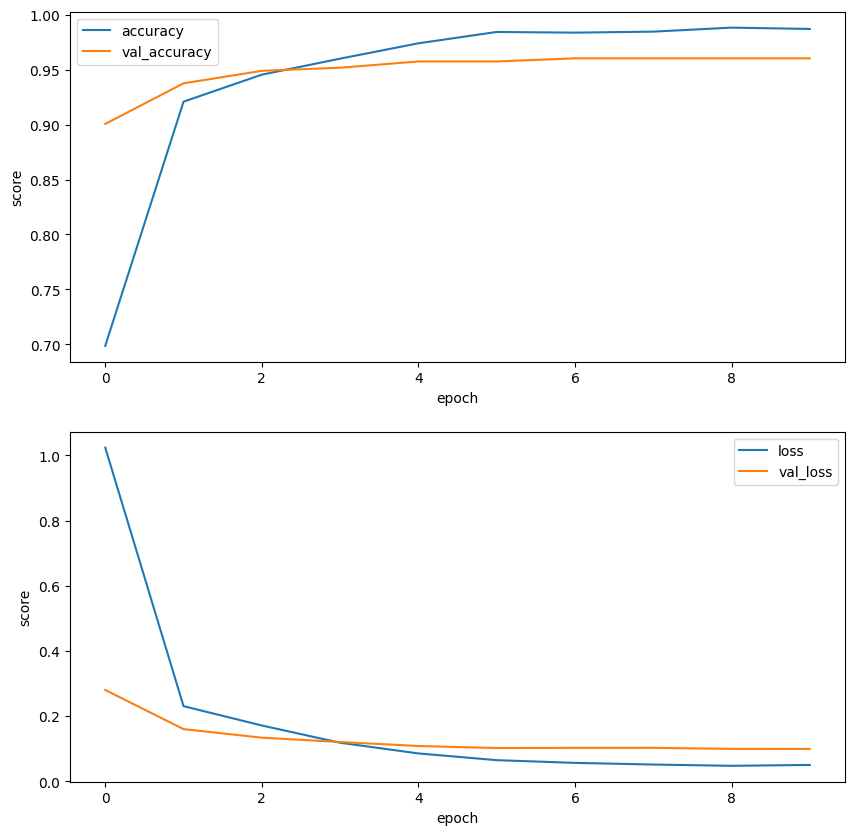

In [44]:
result = pd.DataFrame(history.history)
fig, ax = plt.subplots(2, 1, figsize=(10, 10))
result[["accuracy", "val_accuracy"]].plot(xlabel="epoch", ylabel="score", ax=ax[0])
result[["loss", "val_loss"]].plot(xlabel="epoch", ylabel="score", ax=ax[1])


# Predictions

In [45]:
all_predictions = []
true_batch_labels=[]

i=0

# Iterate over the validation dataset
for batch_images, batch_labels in val_dataset:
    if i==0: print(batch_labels)
    # Make predictions on the current batch
    batch_predictions = model.predict(batch_images).argmax(axis=-1)
    if i==0: print(batch_predictions)
    i+=1
    # Append the predictions to the list
    all_predictions.append(batch_predictions)
    true_batch_labels.append(batch_labels)

# Concatenate predictions from all batches into a single array
all_predictions = np.concatenate(all_predictions, axis=0)
true_batch_labels=np.array(true_batch_labels)
true_batch_labels=np.concatenate(true_batch_labels, axis=0)
print(true_batch_labels)

tf.Tensor([4 0 0 2 0 0 2 1 3 0 0 0 3 4 0 3 2 0 2 4 2 0 2 0 1 3 1 4 4 3 0 4], shape=(32,), dtype=int64)
1/1 [==============================] - 8s 8s/step
[4 0 0 2 0 0 2 1 3 0 0 0 3 4 0 3 2 0 2 4 2 0 4 0 1 3 1 2 4 3 0 4]
1/1 [==============================] - 0s 205ms/step
[4 0 0 2 0 0 2 1 3 0 0 0 3 4 0 3 2 0 2 4 2 0 2 0 1 3 1 4 4 3 0 4 4 4 2 1 4
 0 1 3 4 3 3 4 1 1 0 0 4 2 4 0 4 1 1 2 4 2 1 2 4 3 3 1 0 1 3 2 3 3 2 2 4 2
 0 3 1 2 4 0 4 4 1 4 0 3 2 2 4 1 2 0 1 1 3 3 3 3 4 4 3 2 4 4 2 0 3 4 2 1 2
 4 2 1 4 0 4 0 1 2 2 1 4 2 2 2 3 0 3 3 0 4 4 1 3 3 2 1 2 4 3 1 3 2 1 4 3 0
 3 2 2 4 4 0 0 3 2 3 4 4 2 4 4 1 1 3 4 2 3 1 0 4 4 4 4 2 4 1 0 3 2 4 3 2 4
 4 1 3 3 2 1 0 0 2 2 2 4 1 0 0 1 0 2 2 0 2 3 1 0 2 2 4 3 3 3 4 1 0 2 3 2 3
 3 4 4 2 0 0 1 2 0 2 4 3 3 1 1 3 2 1 2 3 3 1 3 1 4 4 0 1 2 0 4 0 3 2 0 0 3
 1 1 4 0 4 3 2 1 1 0 4 0 3 0 0 1 4 2 1 0 2 4 2 2 3 0 3 1 3 2 3 1 4 3 3 1 1
 0 0 1 3 0 1 2 2 4 2 3 0 2 1 4 2 2 4 1 3 2 2 3 0 4 4 2 2 2 3 4 2 0 0 1 2 2
 4 2 2 3 2 3 3 2 3 4 2 1 0 0 3 4 0 3 0]


In [46]:
print(all_predictions)

[4 0 0 2 0 0 2 1 3 0 0 0 3 4 0 3 2 0 2 4 2 0 4 0 1 3 1 2 4 3 0 4 4 4 2 1 4
 0 1 3 4 3 3 4 1 1 0 0 4 2 4 1 4 1 1 2 4 2 1 2 4 3 3 1 0 1 3 2 3 3 2 2 4 2
 0 3 1 2 4 0 4 4 1 4 0 3 2 2 4 1 2 0 1 1 3 3 3 3 2 0 3 2 4 4 2 0 3 4 2 1 2
 4 2 1 4 0 4 0 1 2 3 1 4 2 2 2 3 0 3 3 0 4 4 1 3 3 2 1 2 4 3 1 3 2 1 4 3 0
 3 2 2 4 4 0 0 3 2 3 4 2 2 4 4 0 1 3 4 2 3 1 0 4 4 4 2 2 4 1 0 3 2 4 3 2 4
 4 1 3 3 2 1 0 0 2 2 2 4 1 0 0 1 0 2 2 0 2 3 1 0 2 2 4 3 3 3 4 1 0 2 3 2 3
 3 4 4 2 0 0 1 2 0 4 4 3 2 1 1 3 2 1 2 3 3 1 3 1 4 4 3 1 2 0 4 0 3 2 0 0 3
 1 1 4 0 4 3 2 1 1 0 4 0 3 0 0 1 4 2 1 0 2 4 2 2 3 0 3 1 4 2 3 1 4 3 3 1 1
 0 0 1 3 0 1 2 2 4 2 3 0 4 1 4 2 2 4 1 3 2 2 3 0 4 4 2 2 2 3 4 2 0 0 1 2 2
 4 2 2 3 2 3 3 2 3 4 2 1 0 0 3 4 0 3 0]


In [47]:
sample_images, sample_labels = next(iter(val_dataset))
print(sample_labels.shape)

predictions = model.predict(sample_images , batch_size=100).argmax(axis=-1)
evaluations = model.evaluate(sample_images, sample_labels, batch_size=100)

print("[val_loss, val_acc]", evaluations)

(32,)
1/1 [==============================] - 14s 14s/step - loss: 0.1607 - accuracy: 0.9375
[val_loss, val_acc] [0.16072222590446472, 0.9375]


In [48]:
sample_images, sample_labels = next(iter(val_dataset))

predictions = model.predict(sample_images, batch_size=16).argmax(axis=-1)

2/2 [==============================] - 0s 190ms/step


In [49]:
print(predictions
      )

[4 0 0 2 0 0 2 1 3 0 0 0 3 4 0 3 2 0 2 4 2 0 4 0 1 3 1 2 4 3 0 4]


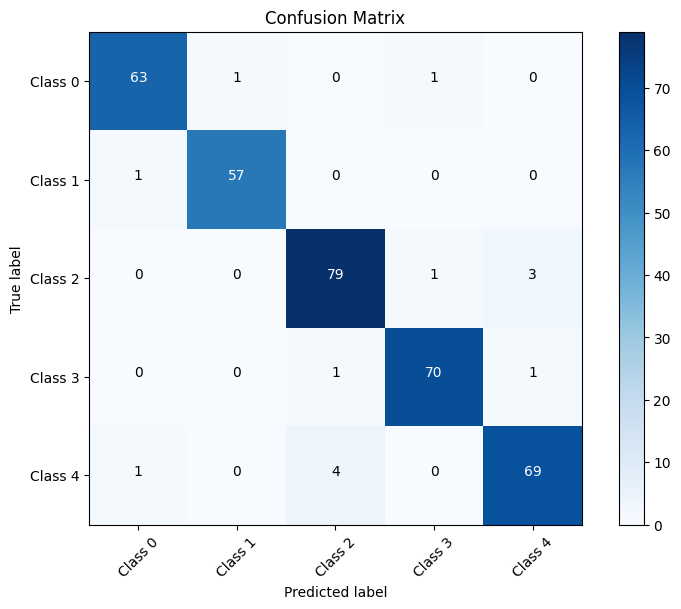

In [50]:
from sklearn.metrics import confusion_matrix
import numpy as np
import matplotlib.pyplot as plt

# Assuming predictions are already computed
#true_labels = np.argmax(sample_labels, axis=-1)
#print(true_labels)

# Compute confusion matrix
conf_matrix = confusion_matrix(true_batch_labels, all_predictions)

# Visualize confusion matrix
plt.figure(figsize=(8, 6))
plt.imshow(conf_matrix, interpolation='nearest', cmap=plt.cm.Blues)
plt.title('Confusion Matrix')
plt.colorbar()
classes = [f'Class {i}' for i in range(conf_matrix.shape[0])]
tick_marks = np.arange(len(classes))
plt.xticks(tick_marks, classes, rotation=45)
plt.yticks(tick_marks, classes)

thresh = conf_matrix.max() / 2.
for i in range(conf_matrix.shape[0]):
    for j in range(conf_matrix.shape[1]):
        plt.text(j, i, format(conf_matrix[i, j], 'd'),
                 horizontalalignment="center",
                 color="white" if conf_matrix[i, j] > thresh else "black")

plt.tight_layout()
plt.ylabel('True label')
plt.xlabel('Predicted label')
plt.show()

## Visualize

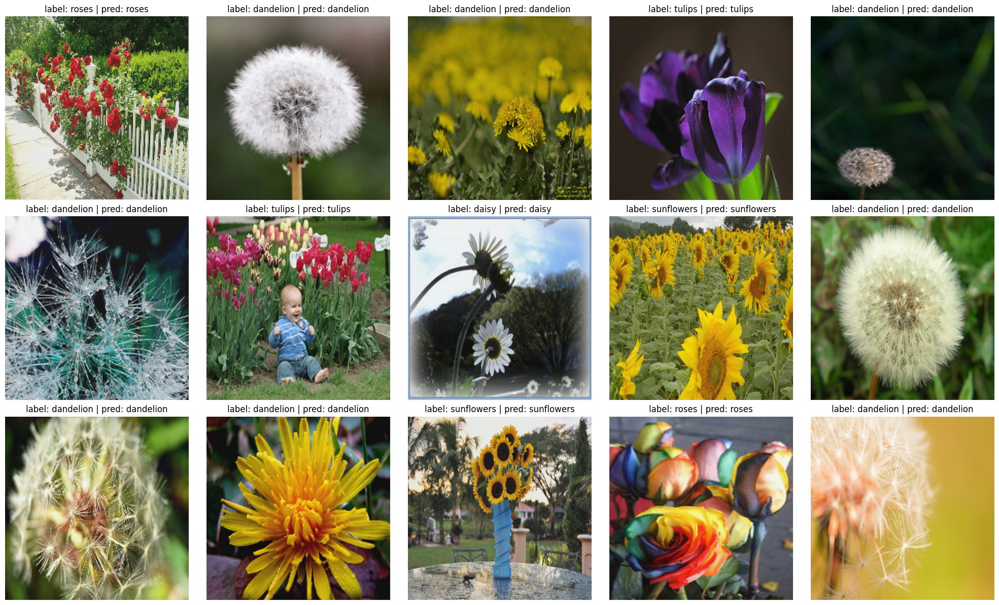

In [51]:
plt.figure(figsize=(5 * 4, 3 * 4))
for i in range(15):
    ax = plt.subplot(3, 5, i + 1)
    image = (sample_images[i] * STD + MEAN).numpy()
    image = (image - image.min()) / (
        image.max() - image.min()
    )  # convert to [0, 1] for avoiding matplotlib warning
    plt.imshow(image)
    target = CLASSES[sample_labels[i]]
    pred = CLASSES[predictions[i]]
    plt.title("label: {} | pred: {}".format(target, pred), fontsize=12)
    plt.axis("off")
plt.tight_layout()
plt.show()


# Grad-CAM

In [52]:
from gcvit.utils import get_gradcam_model, get_gradcam_prediction
from tqdm import tqdm

In [53]:
gradcam_model = get_gradcam_model(model) # make gradcam model

In [54]:
# Generate Grad-CAM heatmaps
heatmaps = []
for i in tqdm(range(15)):
  pred, heatmap = get_gradcam_prediction(sample_images[i].numpy(), gradcam_model, process=False, decode=False)
  heatmaps.append(heatmap)

100%|██████████| 15/15 [00:23<00:00,  1.57s/it]


## Visualize

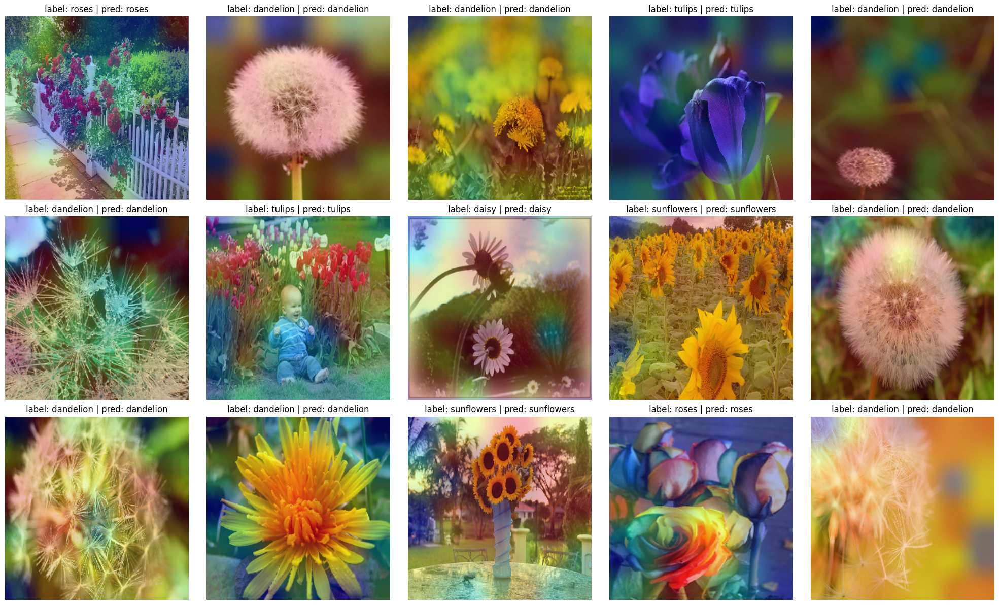

In [55]:
plt.figure(figsize=(5 * 4, 3 * 4))
for i in range(15):
    ax = plt.subplot(3, 5, i + 1)
    plt.imshow(heatmaps[i])
    target = CLASSES[sample_labels[i]]
    pred = CLASSES[predictions[i]]
    plt.title("label: {} | pred: {}".format(target, pred), fontsize=12)
    plt.axis("off")
plt.tight_layout()
plt.show()

# Reference
* [gcvit](https://github.com/awsaf49/gcvit-tf)
* [Keras Flowers on TPU (solution)](https://colab.research.google.com/github/GoogleCloudPlatform/training-data-analyst/blob/master/courses/fast-and-lean-data-science/07_Keras_Flowers_TPU_solution.ipynb)